# Figure 4 Codes

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import os
import sys
current_path = os.getcwd()
parent_directory = os.path.dirname(current_path)
sys.path.append(parent_directory)  # Adds the parent directory to the Python path
from Class.jenie import Jenie
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### Figure 4A

(A) Representative spatial map projections of a full MERFISH experiment in a 4-week-old mouse sagittal section. 

### Define the cell types in the full sagital section for the 4 week mouse

In [3]:
clusters = {
'0': 'Cerebellar granular neurons',
'1': 'Olfactory bulb GABAergic granule neurons',
'2': 'Brain stem oligodendrocytes',
'3': 'L6 glutamatergic neurons',
'4': 'Fibertracts oligodendrocytes',
'5': 'Sparse astrocytes',
'6': 'Cerebellar molecular layer neurons',
'7': 'Brain stem endothelial',
'8': 'L2/3 visual cortex neurons',
'9': 'Brain stem oligodendrocytes (astrocytic)',
'10': 'Inferior colliculus neurons',
'11': 'Fibertracts oligodendrocytes 2',
'12': 'Cortical neurons',
'13': 'Pia matter',
'14': 'Oligodendrocytes (artifact)',
'15': 'Striatal neurons',
'16': 'Thalamic neurons',
'17': 'Cortical endothelial',
'18': 'Striatal neurons 2',
'19': 'L5/6 cortical neurons',
'20': 'Hippocampal astrocytes',
'21': 'Fibertracts oligodendrocytes 3',
'22': 'L6 oligodendrocytes',
'23': 'Olfactory bulb plexiform neurons',
'24': 'Sparse endothlial',
'25': 'Olfactory bulb glomerular neurons',
'26': 'L2/3 somatomotor neurons',
'27': 'Thalamic neurons 2',
'28': 'Medulla neurons',
'29': 'Nucleus accumbens neurons',
'30': 'Superior colliculus neurons',
'31': 'Brain stem astrocytes',
'32': 'Dentate gyrus neurons',
'33': 'Astrocytes',
'34': 'Brain stem astrocytes 2',
'35': 'Thalamic oligodendrocytes',
'36': 'Cerebellar granular neurons 2',
'37': 'Striatal astrocytes',
'38': 'Striatal endothelial',
'39': 'Thalamic oligodendrocytes 2',
'40': 'Sparse oligodendrocytes',
'41': 'Medullary reticular nucleus astrocytes',
'42': 'Pallidum neurons',
'43': 'Cortical neurons',
'44': 'Sparse neurons',
'45': 'Striatal neurons 3',
'46': 'Cerebellar fibertract oligodendrocytes',
'47': 'Thalamic oligodendrocytes 3',
'48': 'L1 anterior olfactory nucleus astrocytes',
'49': 'L2 anterior olfactory nucleus neurons',
'50': 'SVZ ependymal cells',
'51': 'Sparse oligodendrocytes 2',
'52': 'Olfactory bulb fibertract astrocytes',
'53': 'Hippocampal CA1 neurons',
'54': 'Striatal oligodendrocytes',
'55': 'Thalamic endothelial',
'56': 'Sparse neurons',
'57': 'Cortical oligodendrocytes',
'58': 'SVZ astrocytes',
'59': 'Cortical oligodendrocytes',
'60': 'Striatal oligodendrocytes',
'61': 'Medulla fibertract astrocytes',
'62': 'Pons neurons',
'63': 'Olfactory tubercle neurons',
'64': 'Hippocampal endothelial',
'65': 'Substantia nigra astrocytes',
'66': 'Hippocampal CA3 neurons',
'67': 'Retrospenial area neurons',
'68': 'Sparse neurons',
'69': 'Olfactory immature neurons',
'70': 'Reticular nucleus neurons',
'71': 'Retrospenial area neurons',
'72': 'Sparse micro PVM',
'73': 'Sparse neurons (immature)',
'74': 'Cortical & Hippocampal neurons (immature)',
'75': 'Cortical micro PVM',
'76': 'L2/3 cortical neurons',
'77': 'Dorsal stream endothelial',
'78': 'Choroid plexus',
'79': 'Artifact',
'80': 'L1 neurons',
'81': 'Dentate gyrus immature neurons',
'82': 'Artifact 1',
'83': 'Thalamic oligodendrocytes',
'84': 'Artifact 2',
'85': 'Artifact 3',
'86': 'Ventral posteromedial nucleus oligodendrocytes',
'87': 'Lateral preoptic oligodendrocytes',
'88': 'Artifact',
'89': 'Artifact',
'90': 'Artifact',
'91': 'Superior vestibular nucleus',
'92': 'L5 neurons',
'93': 'Endopiriform nucleus, dorsal-part neurons',
'94': 'Striatal neurons 4',
'95': 'Artifact 4',
'96': 'Artifact',
'97': 'Artifact 5',
'98': 'Artifact',
'99': 'Artifact 6',
'100': 'Artifact 7',
'101': 'Artifact 8',
'102': 'Artifact',
'103': 'Artifact 9',
'104': 'Artifact 10',
'105': 'Artifact',
'106': 'Olfactory bulb immature neurons',
'107': 'Artifact 11',
'108': 'Subiculum neurons',
'109': 'Artifact',
'110': 'Artifact 12',
'111': 'Sst neurons',
'112': 'Artifact 13',
'113': 'Artifact 14',
'114': 'Artifact',
'115': 'Artifact',
'116': 'Artifact',
'117': 'Artifact',
'118': 'Artifact'
}


### Check the spatial position of all the cell types defined

In [4]:
adata = sc.read_h5ad("../DataF/fig4/DCBBL1_4week_6_2_2023_combined.h5ad")

adata.obs["celltype"] = adata.obs.leiden.map(clusters)
adata1 = adata[adata.obs.tag == "DCBBL1_4week_6_2_2023_set1"]

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:
week4j = Jenie(adata1, "week4", "week4", "week4_celltype")
# week4j = Jenie(week4[week4.obs.tag == "DCBBL1_4week_6_2_2023_set1"], "week4", "week4", "week4_celltype")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


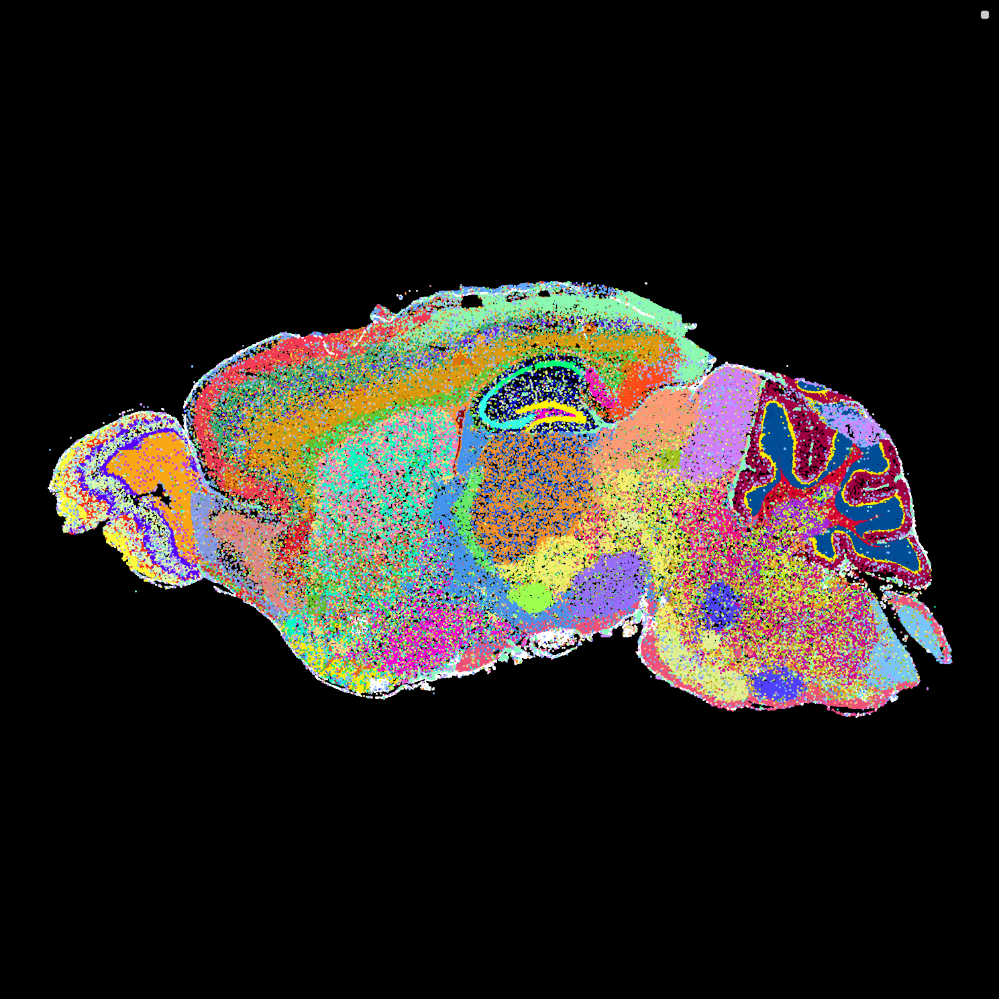

In [6]:
week4j.plot_cluster_scdata("celltype", transpose=-1, sbig=5)

### Figure B

The hippocampus brain region was post-selected and re-clustered to generate 2D UMAP

In [7]:
# read subsetted dg from 4 weeks old mice
adata_all = sc.read_h5ad("../DataF/fig4/adata1_HIP_4week.h5ad")


### Process hippocampus data and recluster

In [8]:
# data processing: remove bad cells

adata_ = adata_all
ifov = 29
ifov_n = 10**5
ifovs = np.array(adata_.obs.index,dtype=int)//ifov_n
bad = ifovs==ifov

adata1_HIP_g = adata_all[~bad]

In [9]:
# recluster hip data 
sc.tl.leiden(adata1_HIP_g, resolution=5) 


/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/tools/_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


In [10]:
# sc.pl.umap(adata1_HIP_g, color="leiden", outline_width=2, legend_loc="on data", legend_fontsize=20, legend_fontoutline=4)

### Label hippocampal neurogenesis path 

In [11]:
# label some of the clusters

mdg = {
    "39": "mdg",
    "19": "mdg",
    "43": "43",
    "26": "mdg",
    "22": "mdg",
    "16": "mdg",
    "35": "mdg",
    "46": "mdg",
    "13": "mdg",
    "16": "mdg",
    "8": "mdg",
    "9": "9",
    "51": "mdg",
    "38": "basal",
    "5": "basal",
    "20": "radial glia",
    "33": "astro",
    "1": "immature"
}

def path(x):
    if x in list(mdg.keys()):
        return mdg[x]
    else:
        return x
    
# set dg_path to partially labeled celltypes
adata1_HIP_g.obs["dg_path"] = adata1_HIP_g.obs.leiden.apply(path)

In [12]:
aj = Jenie(adata1_HIP_g, "HIP", "noastro4weeks2", "dg_path")


### Plot UMAP

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/s

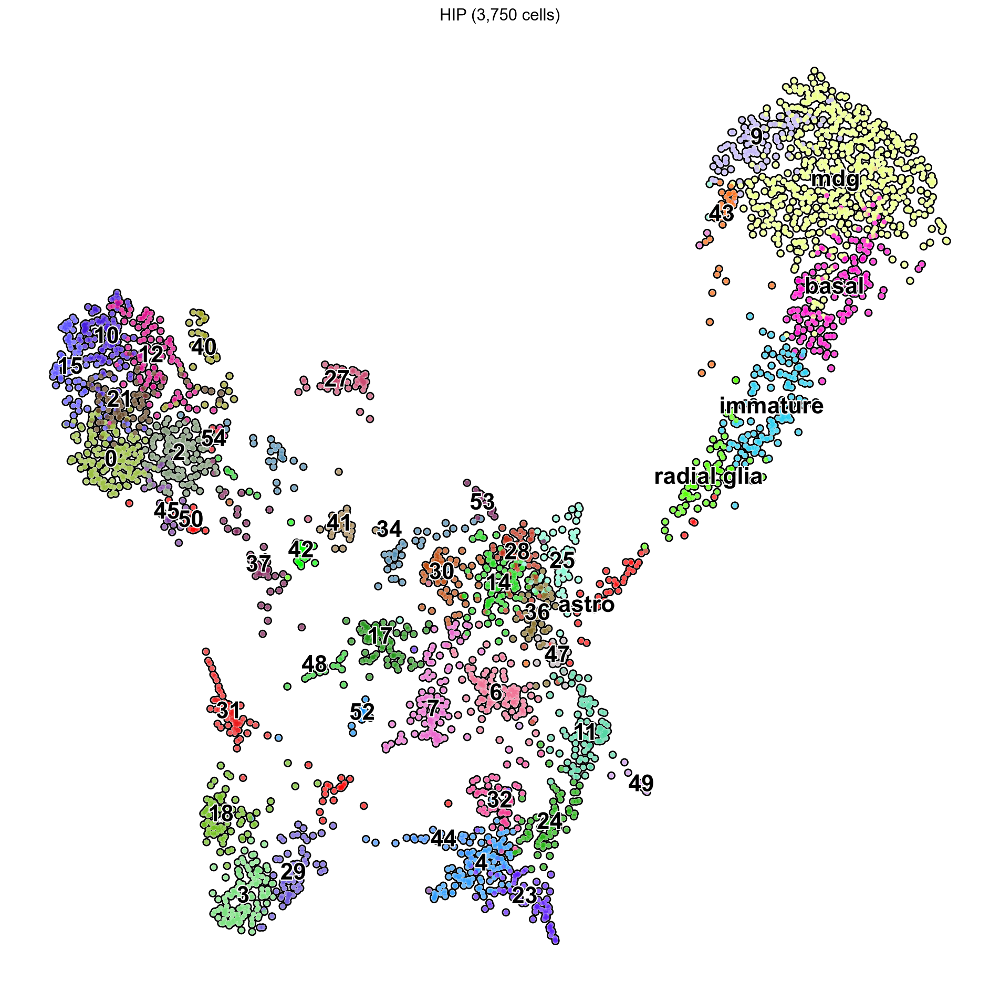

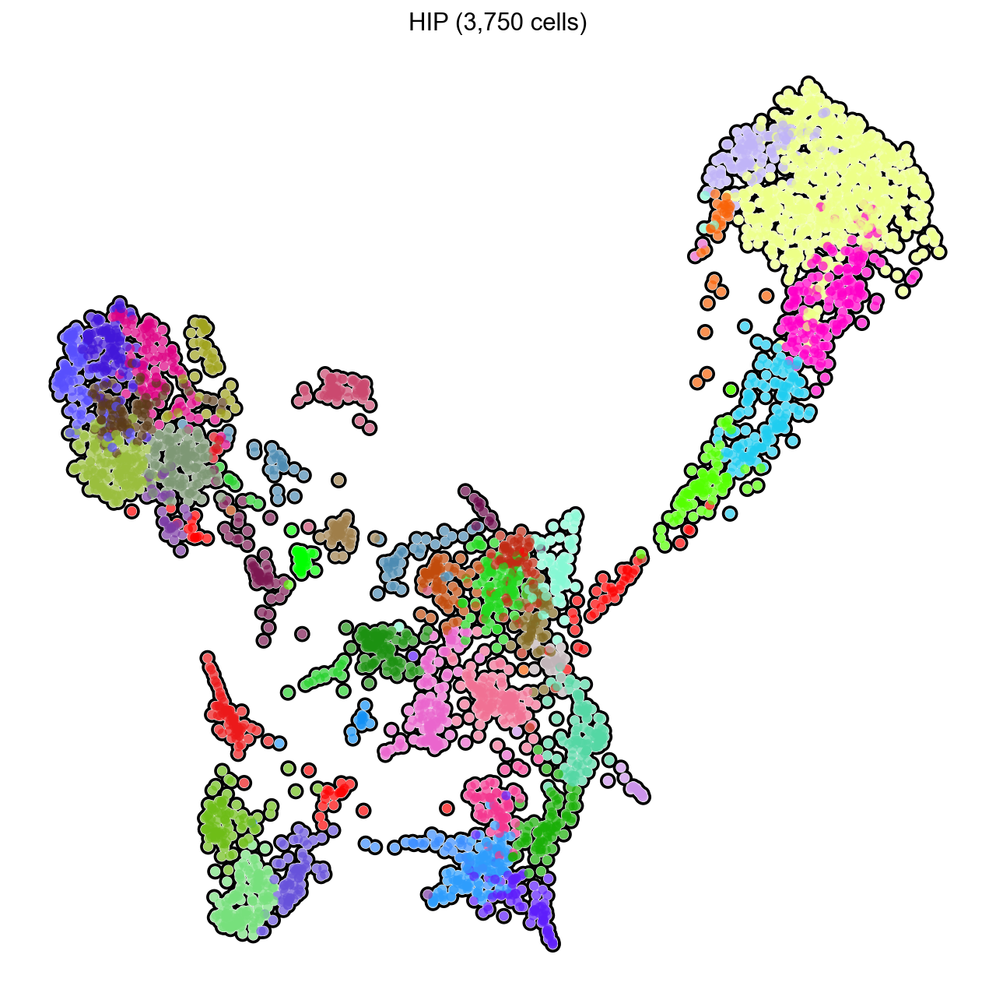

In [13]:
# umap with legend
aj.umap("dg_path",size=70, legend="on data", legend_fontsize=20)
# umap without legend
aj.umap("dg_path",size=120, legend="on daa", legend_fontsize=20, fig=(10,10))

# Figure C

The hippocampus brain region was post-selected and re-clustered to generate spatial projection

### Data Processing

In [14]:
# put the bad resolution cells back into the clustered celltypes
badres = adata_all[bad]
dgpath = aj.data

d = badres

vars1 = list(d.var.index)
vars2 = list(dgpath.var.index)
varsf = np.intersect1d(vars1,vars2)
print("Genes in common:",len(varsf))
d = d[:,varsf]
ref2 = dgpath[:,varsf]
sc.pp.neighbors(dgpath)
sc.pp.pca(d,n_comps=50)
sc.pp.pca(ref2,n_comps=50)
sc.tl.ingest(d,ref2,obs='dg_path')

badresing = d.copy()

Genes in common: 281


/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/kjenie/DataspellProjects/

h3
Distances type: <class 'scipy.sparse._csr.csr_matrix'>


h1


In [15]:
comdg = anndata.concat([badresing, dgpath])

### Plot spatial projection of hippocampal path

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


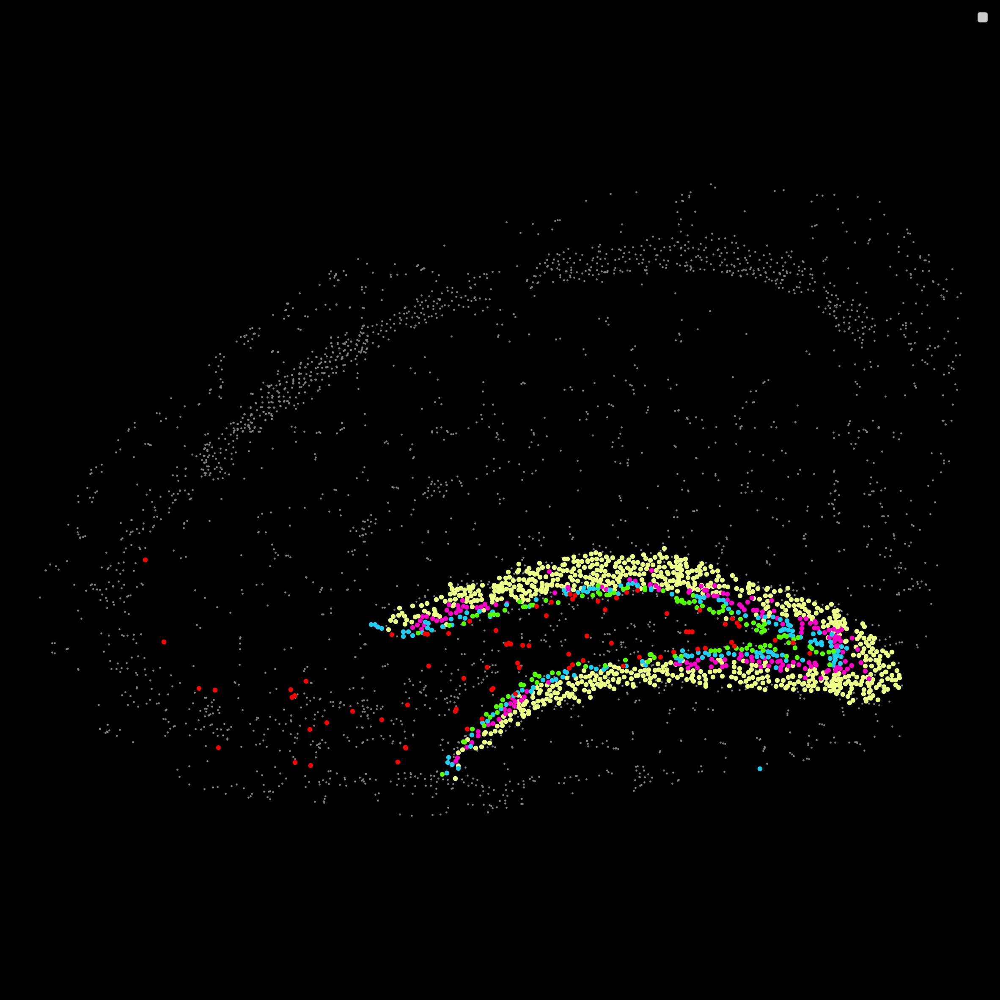

In [16]:
comj = Jenie(comdg, "HIP", "hip", "dg_path")
comj.plot_cluster_scdata(group="dg_path", ref=adata_all, transpose=-1, clusters=["mdg","basal","immature","radial glia","astro"], sbig=70)


### Figure E

Paga analysis of the dentate gyrus neurons

/var/folders/j6/2g6n5jcx4dz5dncsnj0mt2p40000gn/T/ipykernel_56024/2303228792.py:89: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  d.obs['pseudotime'] = d.obs['dpt_pseudotime']
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1229: UserWarning: FixedFormatter should only be used together with FixedLocator
  groups_axis.set_yticklabels(['', xlabel, ''], fontsize=ytick_fontsize)
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1276: UserWarning: FixedFormatter should only be used together with FixedLocator
  anno_axis.set_yticklabels(['', anno, ''], fontsize=ytick_fontsize)


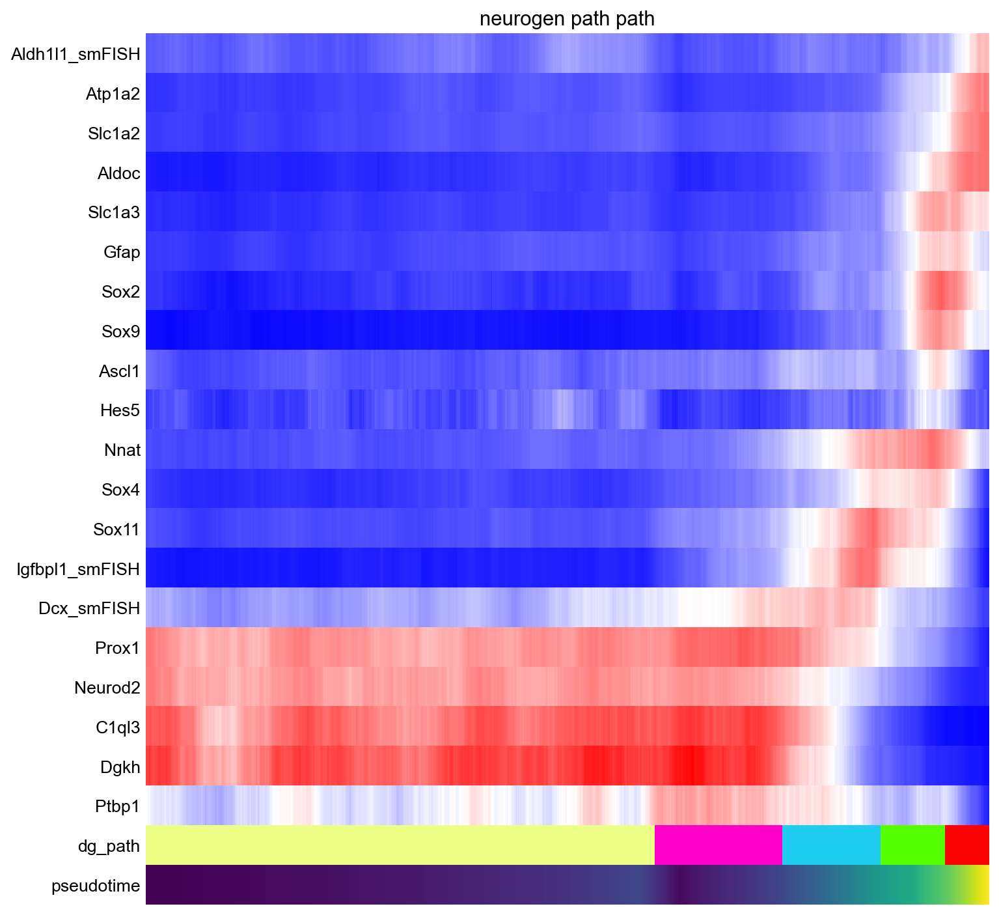

In [17]:
# pick what genes to show
gene_names = [
    "Aldh1l1_smFISH",
    "Atp1a2",
    "Slc1a2",
    "Aldoc",
    "Slc1a3",
    "Gfap",
    "Sox2",
    "Sox9",
    "Ascl1",
    "Hes5",
    "Nnat",
    "Sox4",
    "Sox11",
    "Igfbpl1_smFISH",
    "Dcx_smFISH",
    "Prox1",
    "Neurod2",
    "C1ql3",
    "Dgkh",
    "Ptbp1",
]  

# set the minimum and maximum of each gene
minmaxgenes = {
    'Aqp4': [0, 20],
    'Aldoc': [0, 72],
    'Atp1a2': [0, 130],
    'Sox2': [0, 11],
    'Aldh1l1_smFISH': [0, 26],
    'Sox9': [0, 23],
    'Slc1a3': [0, 71],
    'Slc1a2': [0, 153],
    'Gfap': [0, 74],
    'Ascl1': [0, 12],
    'Sox4': [0, 26],
    'Nnat': [0, 28],
    'Sox11': [0, 36],
    'Dcx_smFISH': [0, 36],
    'Igfbpl1_smFISH': [0, 91],
    'Prox1': [0, 90],
    'Neurod2': [0, 90],
    'C1ql3': [0, 50],
    'Dgkh': [0, 30],
    'Ptbp1': [2, 13],
    'Rest': [2, 7],
    'Hes5': [1, 3]
    }

# pick the path of the pseudotime and the paga
path2 = [ "mdg", "basal","immature", "radial glia","astro"]

# column group in data
group = "dg_path"

# get dg data
d = aj.data.copy()

# do paga and pseudotime calculations
sc.tl.paga(d, groups=group)
sc.tl.diffmap(d)
d.uns['iroot'] = np.flatnonzero(d.obs[group]  == 'mdg')[0] 
sc.tl.dpt(d)

# normalize data
in_path = np.in1d(d.obs['dg_path'],path2)
locs = [d.var.index.get_loc(gene) for gene in gene_names]
vol = d.obsm['volume'][in_path]
rawcellgenes = d.obsm["X_raw"][in_path][:,:]
rawcellgenes = rawcellgenes/vol*np.median(vol) 
rawcellgenes = rawcellgenes[:,locs]
normcellgenes = d.obsm["X_raw"][in_path][:,locs]


for ign in range(rawcellgenes.shape[1]):
    gn = gene_names[ign]
    min_,max_ = minmaxgenes[gn]
    normcellgenes[:,ign] = np.clip((rawcellgenes[:,ign] - min_)/(max_-min_),0,1)


d = d[in_path]
d = d[:, gene_names]

d.X = normcellgenes#np.exp(d.X)-1


descr = 'neurogen path'
d.obs['pseudotime'] = d.obs['dpt_pseudotime']

_, data = sc.pl.paga_path(
        d, path2, gene_names,
        show_node_names=False,
        ytick_fontsize=12,
        left_margin=0.15,
        n_avg=50,
        annotations=['pseudotime'],
        show_yticks=True,
        show_colorbar=False,
        color_map='bwr',
        groups_key=group,
        color_maps_annotations={'pseudotime': 'viridis'},
        title='{} path'.format(descr),
        return_data=True,
        show=False)

# Figure F

Spatial projection of Igfbpl1 & Sox11 

### Plot Sox11

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


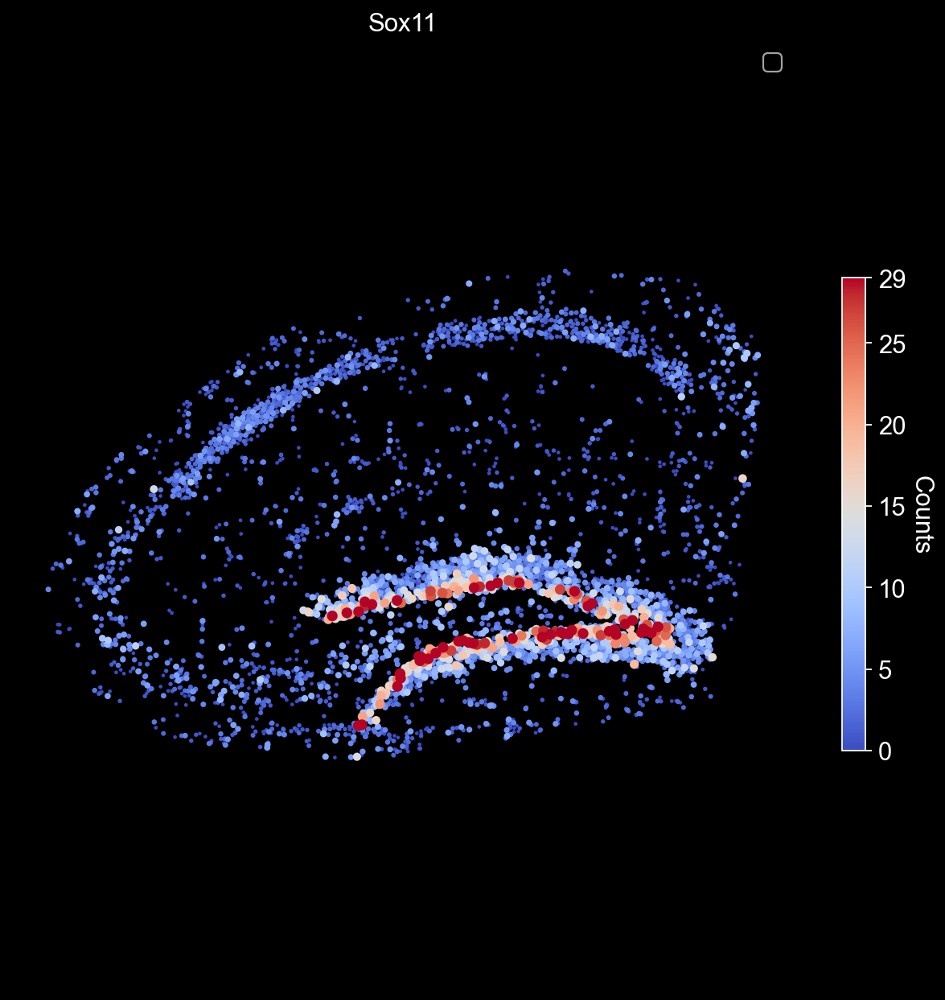

In [18]:
comj.plot_gene_scdata("Sox11", transpose=-1, fig=(8,8), sz_max=100, percentile=99)

### Plot Igfbpl1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


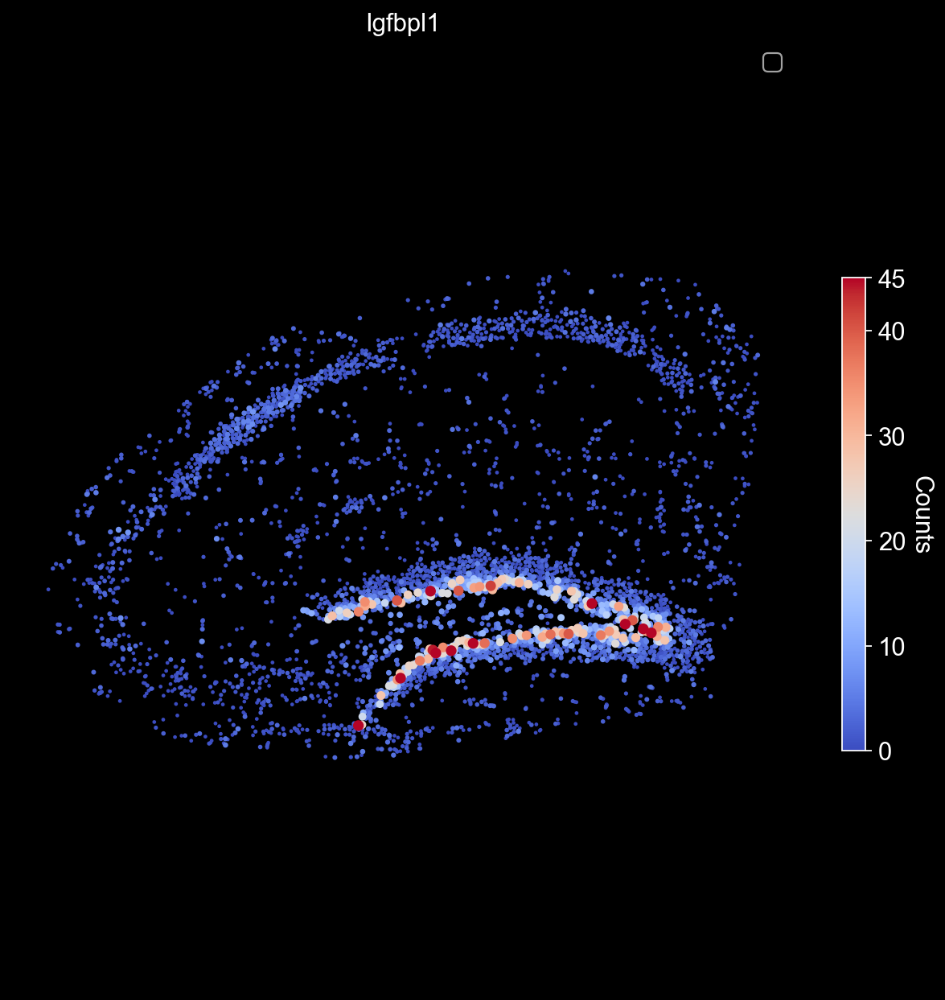

In [19]:
comj.plot_gene_scdata("Igfbpl1", transpose=-1, fig=(8,8), sz_max=100, percentile=99.8)

# Figure I

Representative spatial map of a MERFISH experiment in a 4-week-old mouse sagittal section where the ventricular zone and the canonical new neuronal paths (striatal and olfactory bulb)

### Get Data 

In [20]:
# full 4 weeks old for background spatial projection
ref = sc.read("../DataF/fig4/adata_4week_combined.h5ad")
ref2 = ref[ref.obs.tag == "DCBBL1_4week_6_2_2023_set1"]


/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [21]:
# 4 weeks old subset 
adatasvz_neuro = sc.read_h5ad('../DataF/fig4/adatasvz_neuro_noastro_9_19_4week.h5ad')

### Combine OB Inh Neurons

In [22]:
# label celltypes
obinhneu = [
       'OB Inh Neurons 2',
       'OB Inh Neurons 3',
       'OB Inh Neurons 4',
       'OB Inh Neurons 5',
       'OB Inh Neurons 6',
       'OB Inh Neurons 7',
       'OB Inh Neurons 8',
       'OB Inh neurons 1',
       'OB close to Cortex Inh Neurons'
]

adatasvz_neuro.obs["namesBBRMKJ2"] = adatasvz_neuro.obs["namesBB"].apply(lambda x: "L6 neurons" if ("L6" in x or "Lhx6" in x) else x)
adatasvz_neuro.obs["namesBBRMKJ3"] = adatasvz_neuro.obs["namesBBRMKJ2"].apply(lambda x: "Piriform neurons" if ("Piri" in x) else x)

In [23]:
np.unique(adatasvz_neuro.obs["namesBBRMKJ3"])

array(['Anterior cortical neurons', 'Astro CC', 'CC tip',
       'Choroid Plexus', 'Cortical Neuro/Glia', 'Ependymal',
       'Immature Neurons', 'Immature Neurons OB', 'L6 neurons',
       'OB Gpr17 cells', 'OB Immature Neurons', 'OB Inh Neurons 2',
       'OB Inh Neurons 3', 'OB Inh Neurons 4', 'OB Inh Neurons 5',
       'OB Inh Neurons 6', 'OB Inh Neurons 7', 'OB Inh Neurons 8',
       'OB Inh neurons 1', 'OB Neuro/Glia', 'OB Neuro/Glia 2',
       'OB Neurons Outer', 'OB active Inh Neurons',
       'OB basal Inh Neurons', 'OB close to Cortex Inh Neurons',
       'Piriform neurons', 'Striatal outer neurons',
       'Striatum Near SVZ Neurons 4', 'Striatum Neurons Anterior',
       'Striatum SST neurons', 'Striatum dorsal neurons 2',
       'Striatum neurons 1', 'Striatum neurons 3', 'Striatum neurons 5'],
      dtype=object)

In [24]:
adataj = Jenie(adatasvz_neuro, "adatasvz_neuro", "adatasvz_neuro", "pagasvz")

### Plot Spatial Projection 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


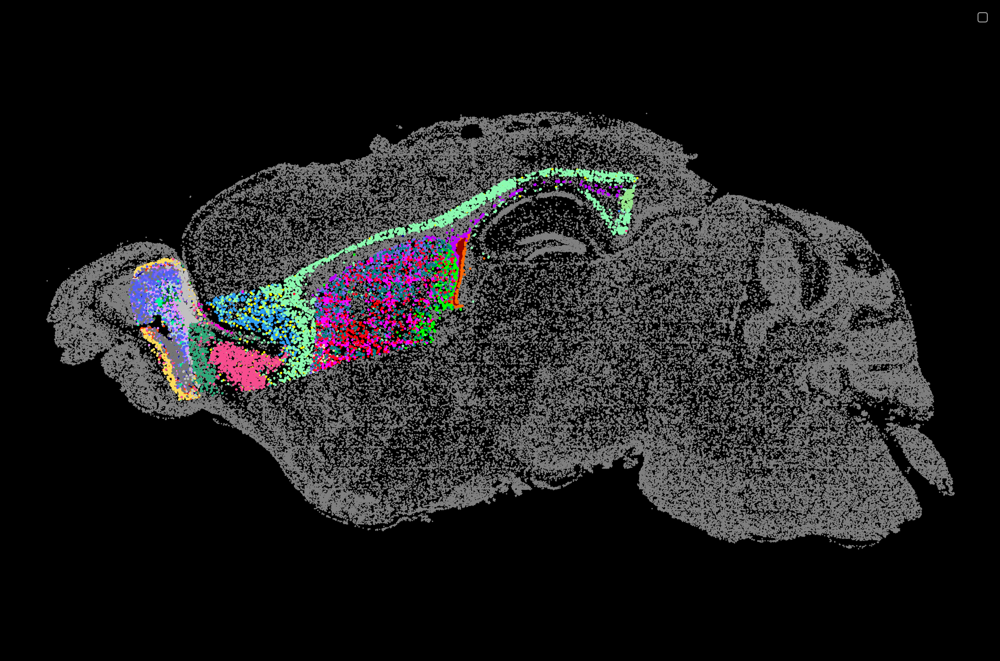

In [25]:
adataj.plot_cluster_scdata("namesBBRMKJ3", ref=ref2, transpose=-1, fig=(15,10), ssm=1, sbig=10,)

# Figure J

Post-selected and re-clustered SVZ path to generate 2D UMAP and spatial maps (J) of the cells composing the tissues.

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


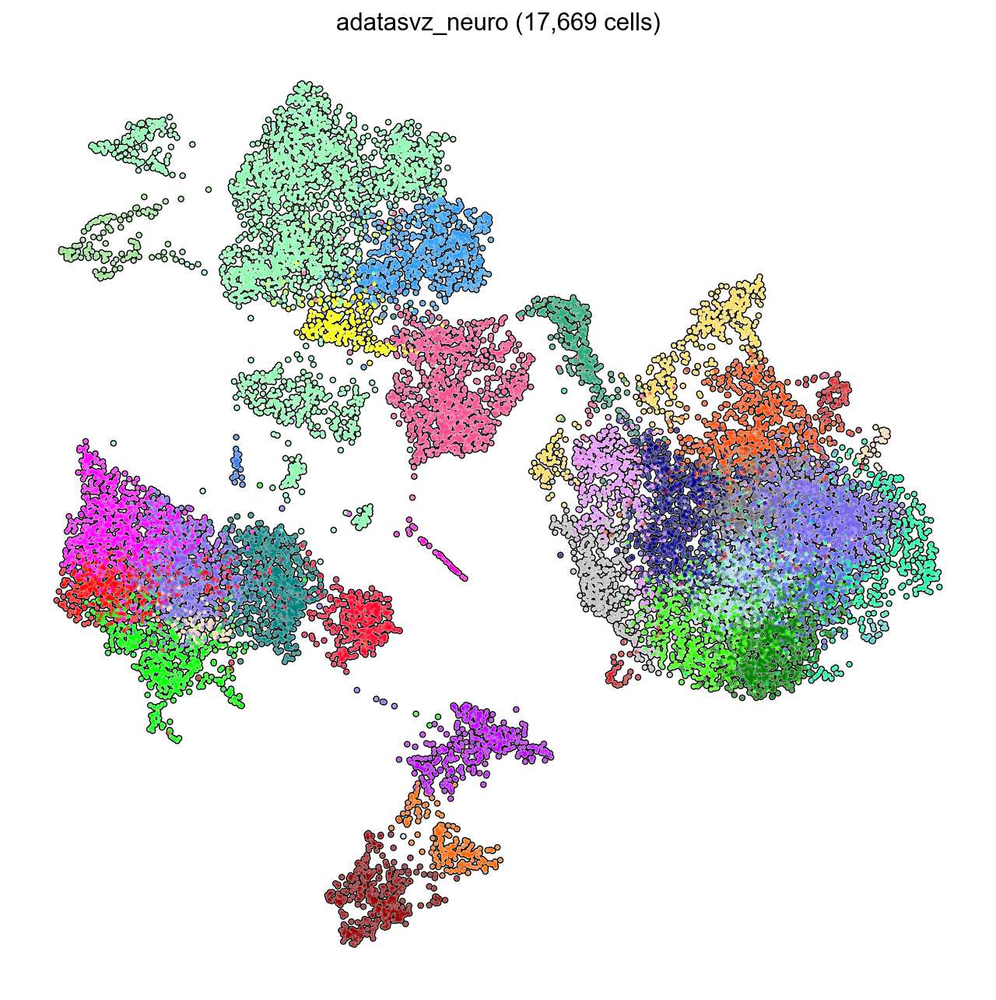

In [26]:
adataj.umap("namesBBRMKJ3", pallete=True, legend="rdaf", fig=(10,10))

# Figure K

Reclustered UMAP for cells composing neurogenesis pathways along the subventricular zone (SVZ).

### Get clusters of neurogenesis path

In [27]:
# get clusters of neurogenesis path
subcluster_ob_str = adataj.get_cluster(["50", "42", "13", "118", "69", "38"], "leiden")

In [28]:
subobstrj = Jenie(subcluster_ob_str, "subcluster neurogenesis ob str", "sub_neuroobstr4weeks", "svz_week4obstr")

### Reprocess subset: recalculate pca, neighbors, and clustering


In [29]:
# reprocess subset: recalculate pca, neighbors, and clustering
subobstrj.reprocess()
subobstrj.reumap(0.75)
subobstrj.recluster(1.5)



### Plot UMAP of reclustering

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


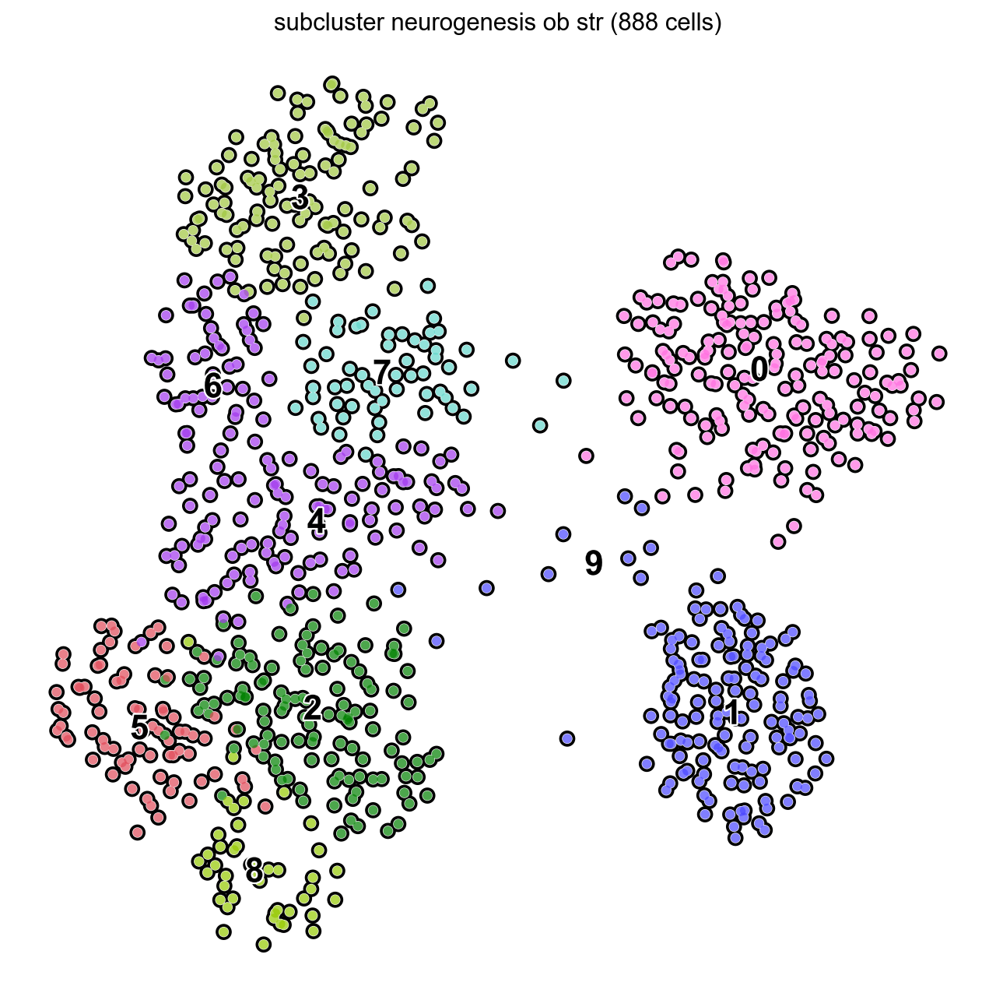

In [30]:
# change colors
subobstrj.change_pallete("svz_week4ob")
# plot umap of clustering
subobstrj.umap(fig=(10,10), legend="on data", pallete=True, size=120, legend_fontsize=20, group="leiden")

### Spatial projection of reclustered data

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


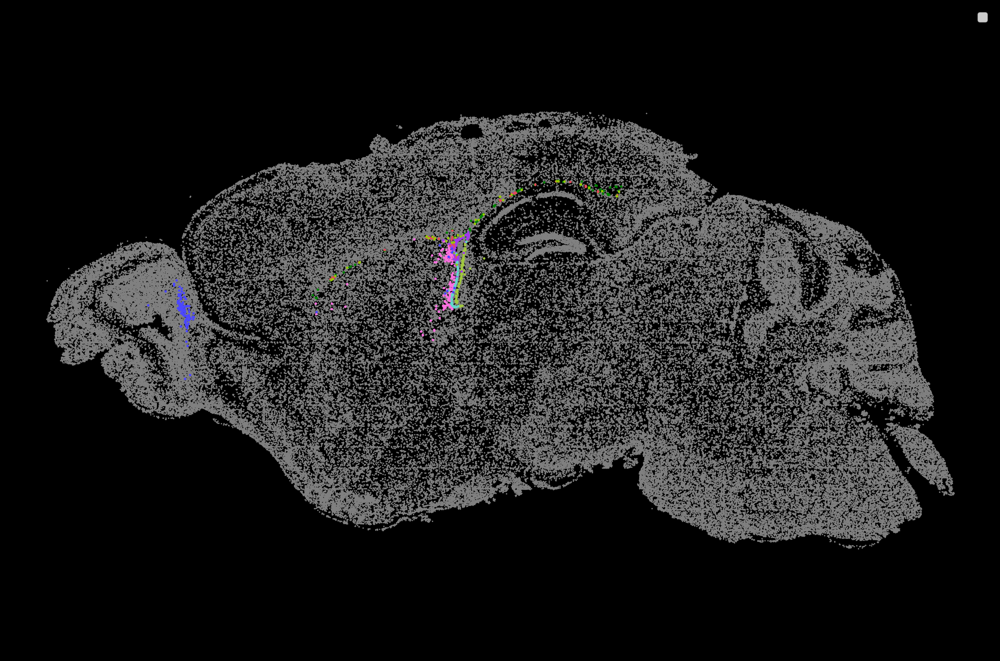

In [31]:
# spatial projection of reclustered data
subobstrj.plot_cluster_scdata("leiden", ref=ref2, transpose=-1, fig=(15,10), ssm=1, sbig=10,)

### Label celltyeps from leiden clustering 

In [32]:
# label leiden clustering from spatial projection
neurogenesis_pathway = {
    "0": "GABAergic striatum neurons",
    "9": "GABAergic striatum neurons",
    "1": "OB neurons",
    "2": "Stage 2",
    "3": "Medial ependymal",
    "4": "Stage 1",
    "7": "Stage 1",
    "6": "Lateral ependymal",
    "5": "Stage 3",
    "8": "SVZ oligos",
}

# save labels on neurogenesis_pathway
subobstrj.data.obs["neurogenesis_pathway"] = subobstrj.data.obs.leiden.map(neurogenesis_pathway)
subobstrj.change_pallete("neurogenesis_pathway")


/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


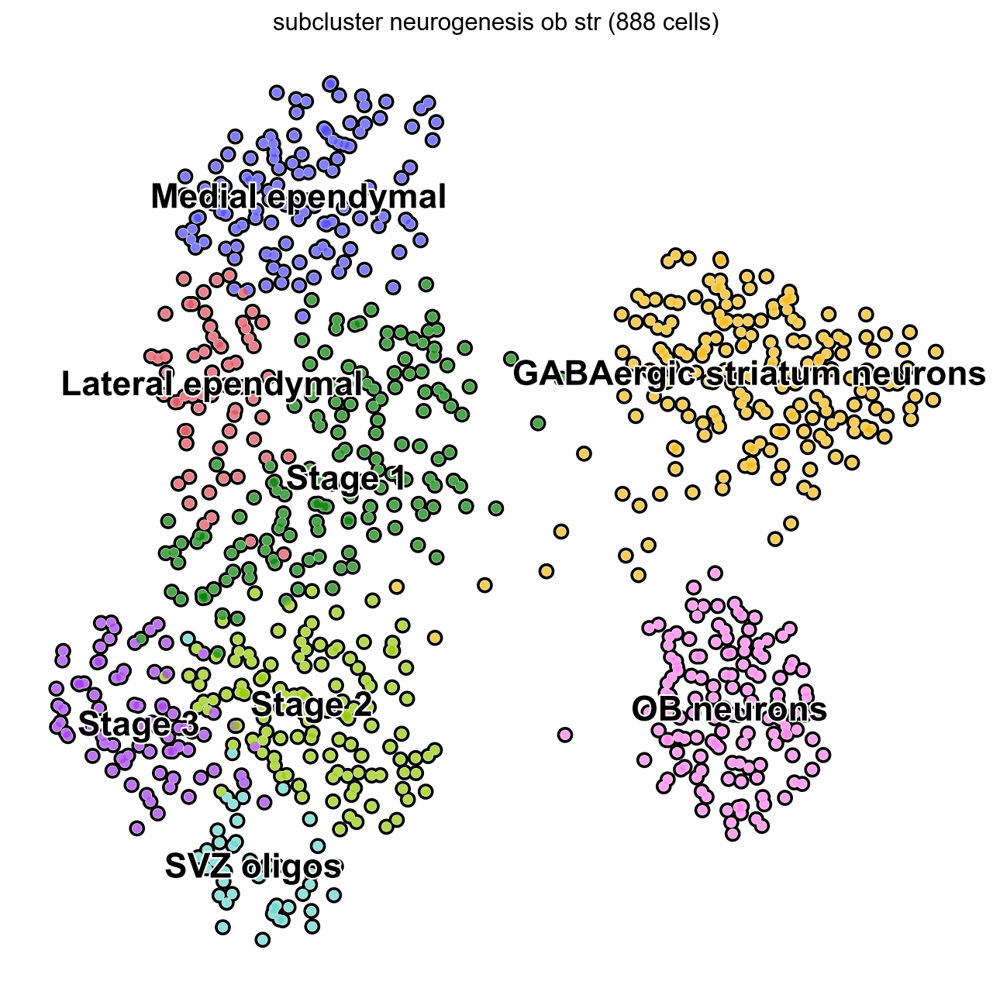

In [33]:
# plot umap with labeled reclustered subset
subobstrj.umap(fig=(10,10), legend="on data", pallete=True, size=120, legend_fontsize=20, group="neurogenesis_pathway")

# Figure L

PAGA analysis & spatial projection of neurogenesis striatal path and olfactory bulb path

### Spatial projection of labeled neurogenesis striatal path and olfactory bulb path

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


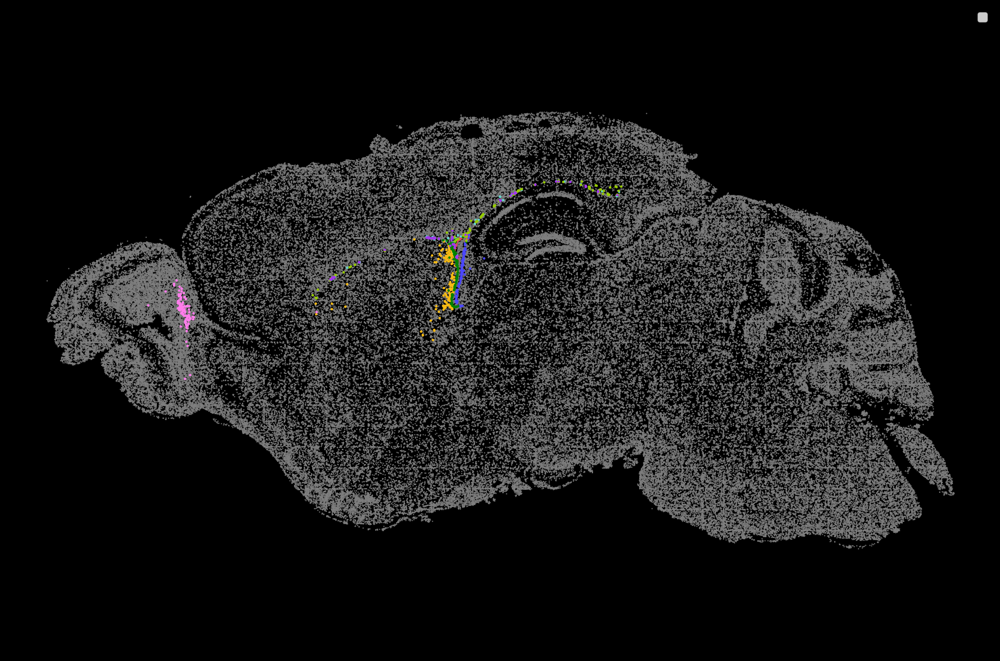

In [34]:
# spatial projection of labeled reclustered data
subobstrj.plot_cluster_scdata("neurogenesis_pathway", ref=ref2, transpose=-1, fig=(15,10), ssm=0.5, sbig=10,)

### Striatal path spatial projection

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


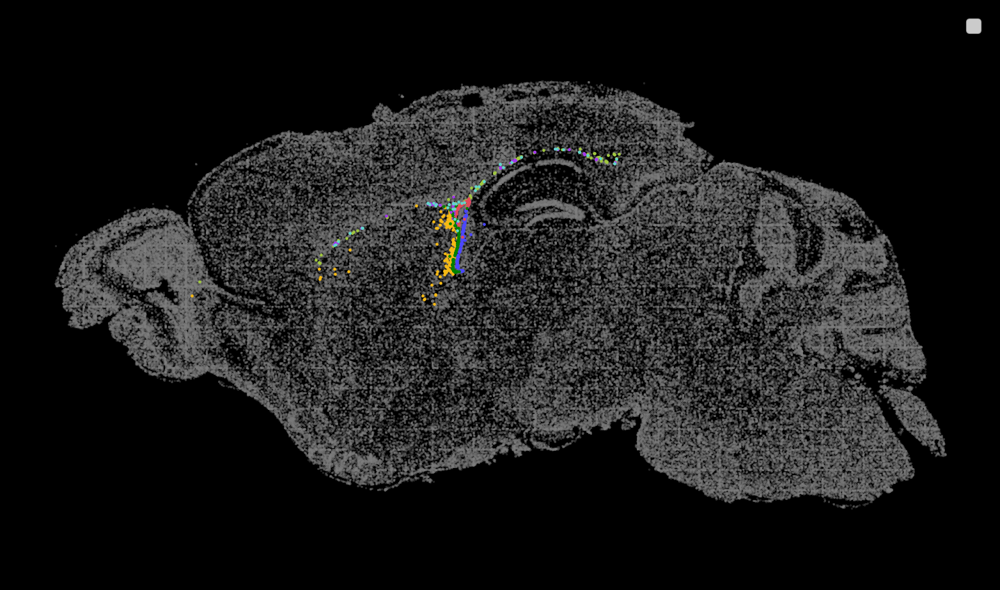

In [35]:
# get striatal path
subcluster = adataj.get_cluster(["50", "42", "13", "118", "38"], "leiden")
subj = Jenie(subcluster, "subcluster neurogenesis", "sub_neuro4weeks", "svz_week4.2")

# re-analyze and re-cluster striatal path
subj.reprocess()
subj.recluster(1.2)
subj.change_pallete("svz_week4.3")

# plot spatial projection
subj.plot_cluster_scdata("leiden", ref=ref2, transpose=-1, fig=(10,6), ssm=0.1, sbig=5)

### Striatal path PAGA analysis

In [36]:
# function to get min and max of the genes
def get_minmax_genes(adata, genes, group="leiden", percentile=99, min=0):
    data = {}
    for gene in genes:
        in_path = np.in1d(adata.obs[group],path)
        data[gene] = [min, int(np.percentile(adata.obsm["X_raw"][in_path][:,adata.var.index.get_loc(gene)],percentile,axis=0))]
    print(data)
    return data

In [37]:
group="leiden"
path = ['2', '5', '6','3','1','4','0']

gene_names = [
                'Vim',
                'Slc2a1',
                'Zfp36l1',
                'Sox9',
                # 'Gfap',
                'Sox2_smFISH',
                'Nnat',
                'Slc1a3',
                'Fam107a',
                'Mfge8',
                'Ascl1',
                'Hes5',
                'Sox4',
                'Sox11',
                'Dlx1',
                'Dlx2',
                'Igfbpl1_smFISH',
                'Dcx',
                'Ngef',
                'Pde10a',
                'Nrgn',
                'Ptbp1',
                'Rest',
                'Pou3f2',
                ]           

{'Vim': [1, 9], 'Slc2a1': [1, 20], 'Zfp36l1': [1, 14], 'Sox9': [1, 24], 'Sox2_smFISH': [1, 30], 'Nnat': [1, 24], 'Slc1a3': [1, 15], 'Fam107a': [1, 10], 'Mfge8': [1, 8], 'Ascl1': [1, 5], 'Hes5': [1, 2], 'Sox4': [1, 18], 'Sox11': [1, 16], 'Dlx1': [1, 15], 'Dlx2': [1, 16], 'Igfbpl1_smFISH': [1, 19], 'Dcx': [1, 3], 'Ngef': [1, 22], 'Pde10a': [1, 38], 'Nrgn': [1, 15], 'Ptbp1': [1, 10], 'Rest': [1, 4], 'Pou3f2': [1, 11]}


/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/tools/_paga.py:128: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[groups + '_sizes'] = np.array(paga.ns)
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1229: UserWarning: FixedFormatter should only be used together with FixedLocator
  groups_axis.set_yticklabels(['', xlabel, ''], fontsize=ytick_fontsize)
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1276: UserWarning: FixedFormatter should only be used together with FixedLocator
  anno_axis.set_yticklabels(['', anno, ''], fontsize=ytick_fontsize)


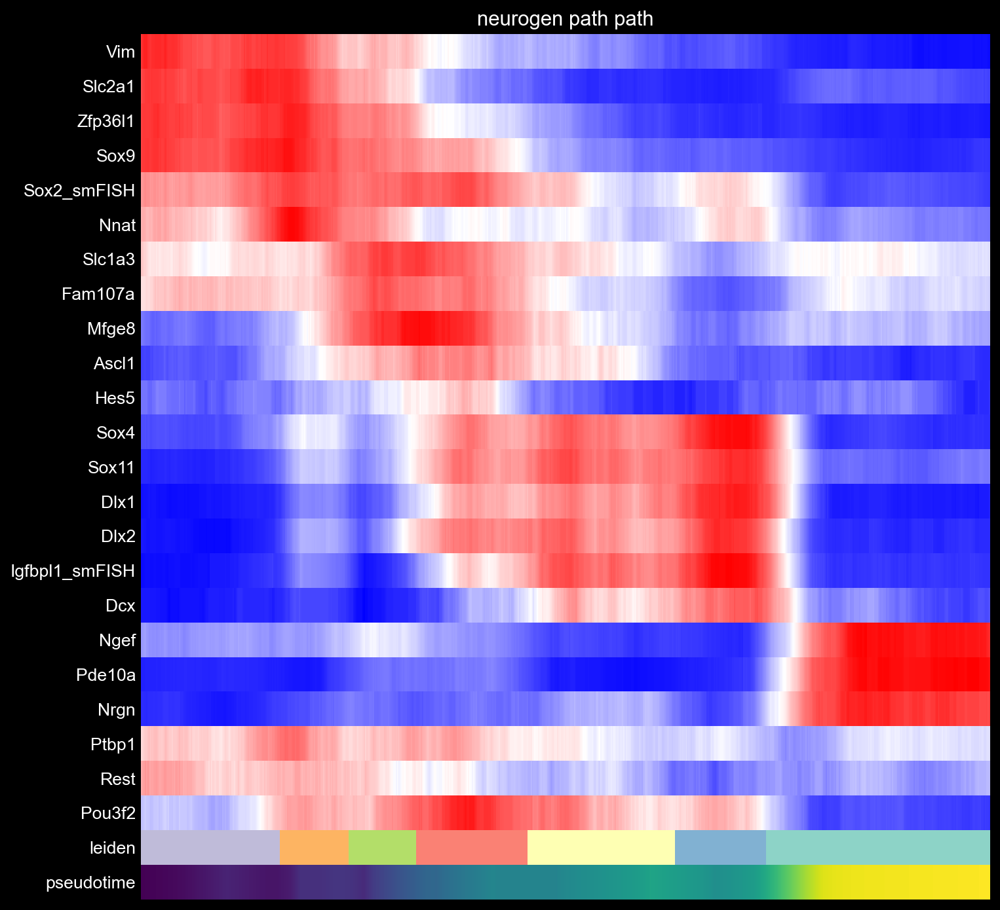

In [38]:
# paga for striatal path

sc.set_figure_params(figsize=(10,10))
plt.style.use("dark_background")
minmaxgenes = get_minmax_genes(subj.data, gene_names, percentile=80, min=1)


d = subj.data.copy()

in_path = np.in1d(d.obs[group],path)
locs = [d.var.index.get_loc(gene) for gene in gene_names]
vol = d.obsm['volume'][in_path]
rawcellgenes = d.obsm["X_raw"][in_path][:,:]
rawcellgenes = rawcellgenes/vol*np.median(vol) 
rawcellgenes = rawcellgenes[:,locs]

normcellgenes = d.obsm["X_raw"][in_path][:,locs]


for ign in range(rawcellgenes.shape[1]):
    gn = gene_names[ign]
    min_,max_ = minmaxgenes[gn]
    normcellgenes[:,ign] = np.clip((rawcellgenes[:,ign] - min_)/(max_-min_),0,1)


d = d[in_path]
d = d[:, gene_names]

d.X = normcellgenes#np.exp(d.X)-1


descr = 'neurogen path'

sc.tl.paga(d, groups=group)
sc.tl.diffmap(d)
d.uns['iroot'] = np.flatnonzero(d.obs[group]  == "2")[1]

_, data = sc.pl.paga_path(
        d, path, gene_names,
        show_node_names=False,
        ytick_fontsize=12,
        left_margin=0.15,
        n_avg=50,
        annotations=['pseudotime'],
        show_yticks=True,
        show_colorbar=False,
        color_map='bwr',
        groups_key=group,
        color_maps_annotations={'pseudotime': 'viridis'},
        title='{} path'.format(descr),
        return_data=True,
        show=False)

### Olfactory bulb path spatial projection

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


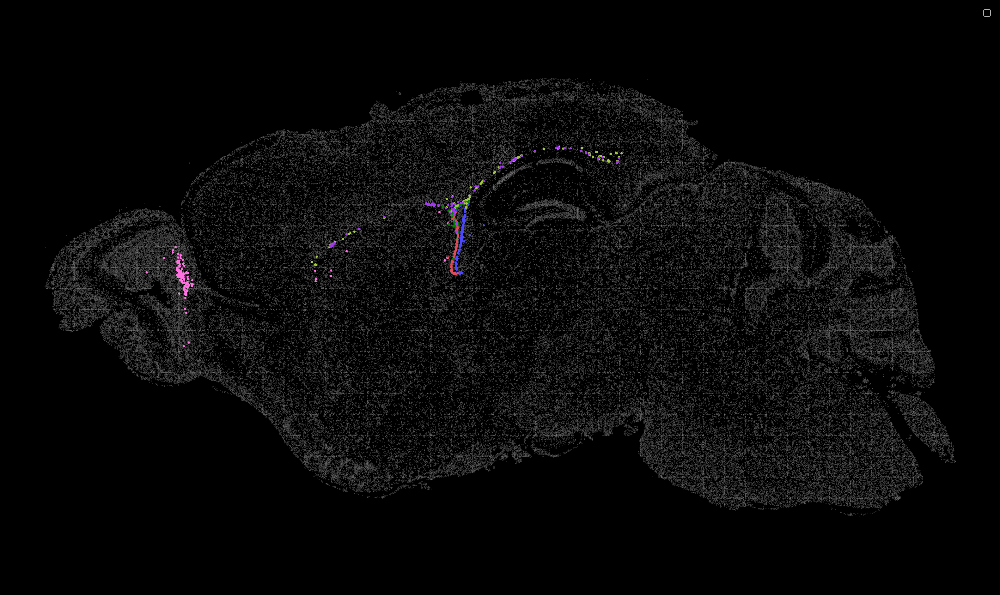

In [39]:
# get ob path
subcluster_ob = adataj.get_cluster(["50", "42", "13", "118", "69"], "leiden")
subobj = Jenie(subcluster_ob, "subcluster neurogenesis ob", "sub_neuroob4weeks", "svz_week4ob")

# re-analyze and re-cluster ob path
subobj.reprocess()
subobj.recluster(1.2)
subobj.change_pallete("svz_week4ob")

# plot spatial projection
subobj.plot_cluster_scdata("leiden", ref=ref2, transpose=-1, fig=(20,12), ssm=0.1, sbig=20)

### Olfactory bulb PAGA analysis

In [40]:
group="leiden"
path = ['1','5','2', '3','4','6','0']

gene_names = [
    'Vim',
    'Slc2a1',
    'Zfp36l1',
    'Sox9',
    'Sox2_smFISH',
    'Nnat',
    'Slc1a3',
    'Fam107a',
    'Mfge8',
    'Ascl1',
    'Hes5',
    'Sox4',
    'Sox11',
    'Dlx1',
    'Dlx2',
    'Igfbpl1_smFISH',
    'Dcx',
    'Gad1',
    'Rbfox3',
    'Ptbp1',
    'Rest',
    'Pou3f2',
    ]           

{'Vim': [1, 9], 'Slc2a1': [1, 20], 'Zfp36l1': [1, 14], 'Sox9': [1, 24], 'Sox2_smFISH': [1, 30], 'Nnat': [1, 24], 'Slc1a3': [1, 15], 'Fam107a': [1, 10], 'Mfge8': [1, 8], 'Ascl1': [1, 5], 'Hes5': [1, 2], 'Sox4': [1, 18], 'Sox11': [1, 16], 'Dlx1': [1, 15], 'Dlx2': [1, 16], 'Igfbpl1_smFISH': [1, 19], 'Dcx': [1, 3], 'Gad1': [1, 15], 'Rbfox3': [1, 4], 'Ptbp1': [1, 10], 'Rest': [1, 4], 'Pou3f2': [1, 11]}


/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/tools/_paga.py:128: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[groups + '_sizes'] = np.array(paga.ns)
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1229: UserWarning: FixedFormatter should only be used together with FixedLocator
  groups_axis.set_yticklabels(['', xlabel, ''], fontsize=ytick_fontsize)
/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1276: UserWarning: FixedFormatter should only be used together with FixedLocator
  anno_axis.set_yticklabels(['', anno, ''], fontsize=ytick_fontsize)


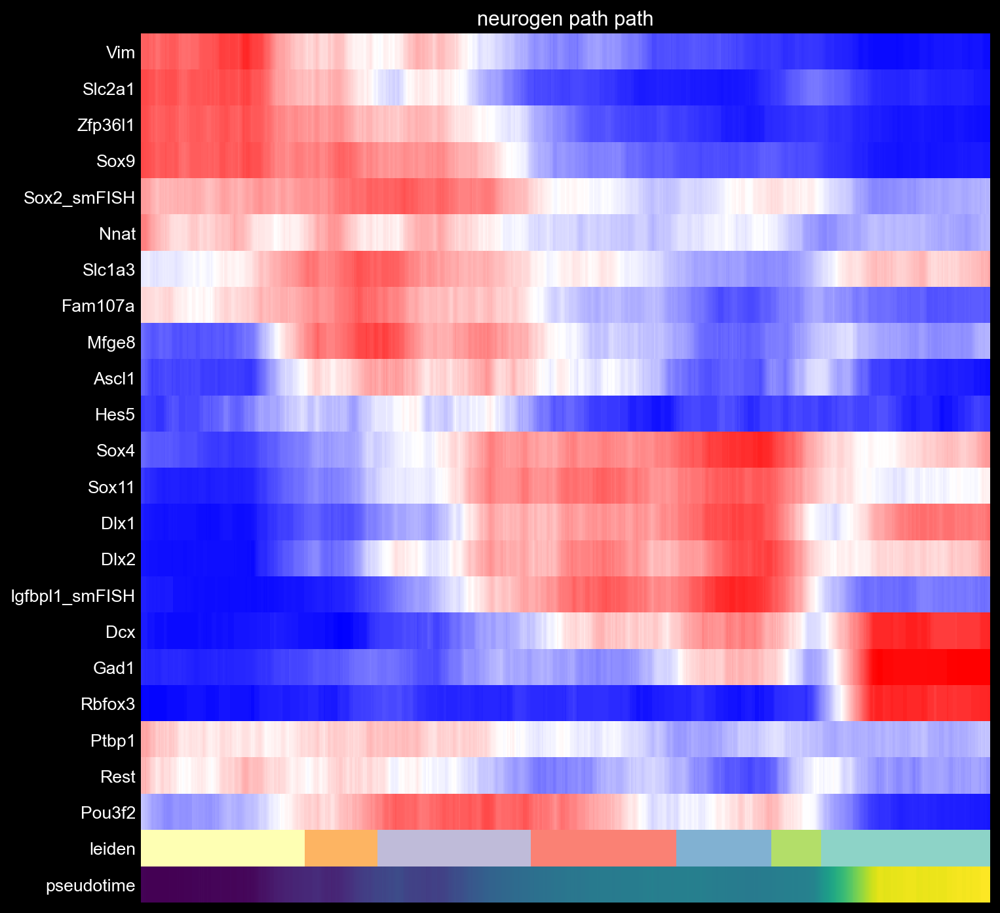

In [41]:
# paga for ob path

sc.set_figure_params(figsize=(10,10))
plt.style.use('dark_background')

d = subobj.data.copy()

minmaxgenes = get_minmax_genes(subj, gene_names, percentile=80, min=1)




in_path = np.in1d(d.obs[group],path)
locs = [d.var.index.get_loc(gene) for gene in gene_names]
#Ns = np.sum(d.obsm["X_raw"][in_path],axis=-1)[:,np.newaxis]
#rawcellgenes = d.obsm["X_raw"][in_path][:,locs]/Ns*np.median(Ns)
#rawcellgenes = d.obsm["X_raw"][in_path][:,locs]
vol = d.obsm['volume'][in_path]
rawcellgenes = d.obsm["X_raw"][in_path][:,:]
rawcellgenes = rawcellgenes/vol*np.median(vol) ### norm by volume
# Ns = np.sum(rawcellgenes,axis=-1)[:,np.newaxis]
#rawcellgenes = rawcellgenes/Ns*np.median(Ns) ### norm by total counts
rawcellgenes = rawcellgenes[:,locs]

normcellgenes = d.obsm["X_raw"][in_path][:,locs]


for ign in range(rawcellgenes.shape[1]):
    gn = gene_names[ign]
    min_,max_ = minmaxgenes[gn]
    normcellgenes[:,ign] = np.clip((rawcellgenes[:,ign] - min_)/(max_-min_),0,1)


d = d[in_path]
d = d[:, gene_names]

d.X = normcellgenes#np.exp(d.X)-1


descr = 'neurogen path'

sc.tl.paga(d, groups=group)
sc.tl.diffmap(d)
d.uns['iroot'] = np.flatnonzero(d.obs[group]  == "2")[1] ###############starting points
sc.tl.dpt(d)

_, data = sc.pl.paga_path(
        d, path, gene_names,
        show_node_names=False,
        ytick_fontsize=12,
        left_margin=0.15,
        n_avg=50,
        annotations=['pseudotime'],
        show_yticks=True,
        show_colorbar=False,
        color_map='bwr',
        groups_key=group,
        color_maps_annotations={'pseudotime': 'viridis'},
        title='{} path'.format(descr),
        return_data=True,
        show=False)

# Supplemental Figure 5

# Figure A

Dentate gyrus celltype correlation with Linnarson data

<Figure size 2250x2250 with 0 Axes>

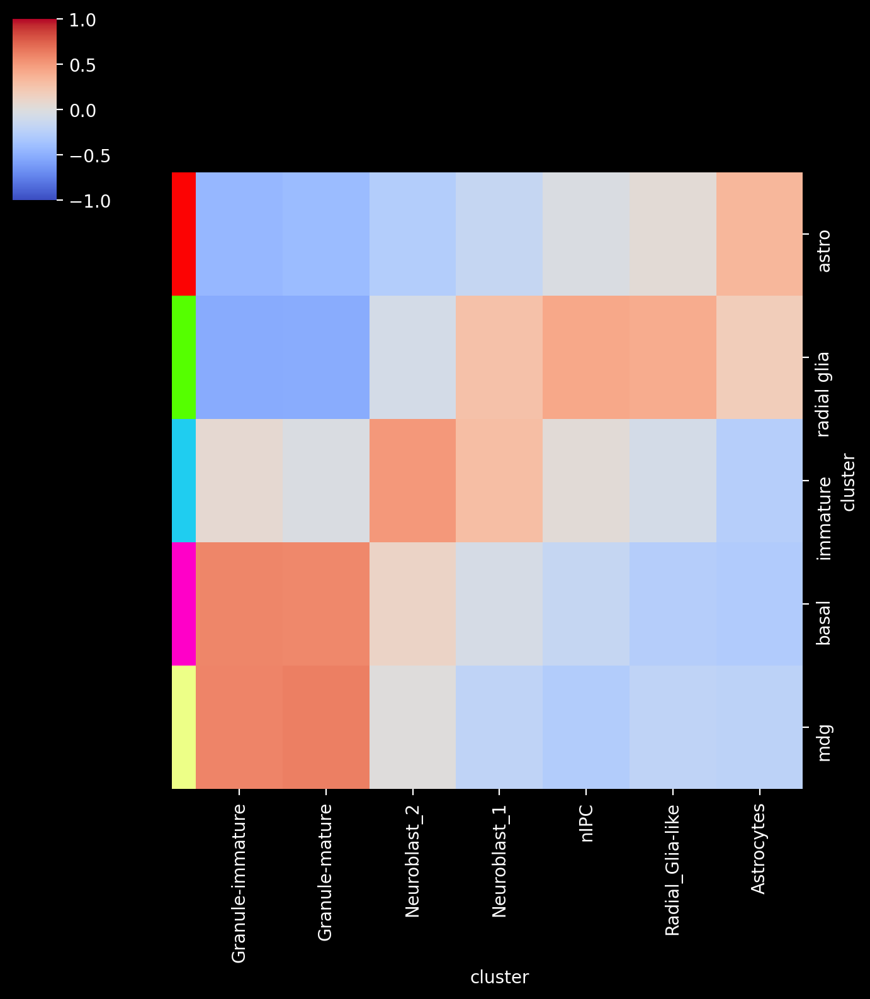

In [43]:
# get subset of dentate gyrus clusters
subdg = aj.get_cluster(["mdg","basal","immature","radial glia","astro"], "dg_path")
subdgj = Jenie(subdg, "subdg", "subdg", "dg_path")

# correlate with linnarson data
plt.style.use("default")
subdgj.corr_linnarson(group="dg_path", order_x = ["Granule-immature", "Granule-mature", "Neuroblast_2","Neuroblast_1", "nIPC", "Radial_Glia-like", "Astrocytes"], order_genes=["astro", "radial glia", "immature", "basal","mdg"])

# Figure B

Dentate gyrus associated genes dotplot of Linnarson Data

In [44]:
# gene markers and celltypes for dotplot
markers = ["Gfap", "Slc1a2", "Ascl1", "Vim", "Dcx", "Sox11","Prox1"]
celltypes = ["Granule-immature", "Granule-mature", "Neuroblast_2","Neuroblast_1", "nIPC", "Radial_Glia-like", "Astrocytes"]

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


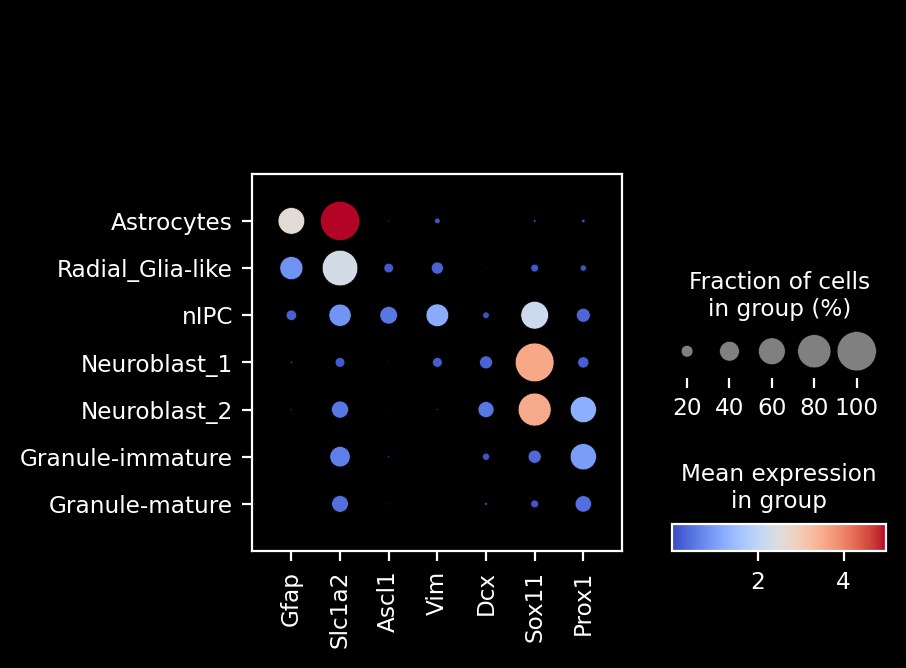

In [45]:
linnarsondata = sc.read("../DataF/supfig5/datasetA.h5ad")
sc.pl.dotplot(linnarsondata[linnarsondata.obs["cluster_name"].isin(celltypes)], markers, groupby='cluster_name', dendrogram=False, cmap="coolwarm", vmax=5, categories_order=["Astrocytes", "Radial_Glia-like", "nIPC", "Neuroblast_1", "Neuroblast_2", "Granule-immature", "Granule-mature"])


# Figure C

Dentate gyrus associated genes dotplot of our data

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


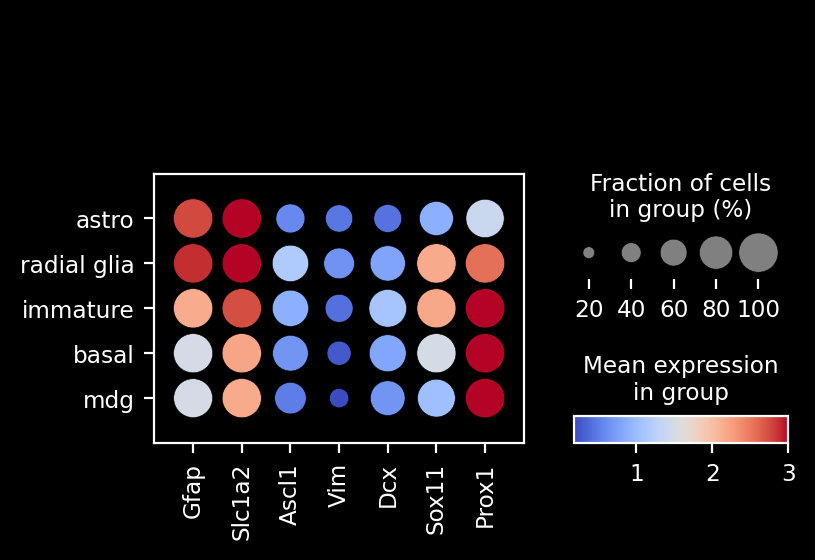

In [46]:
sc.pl.dotplot(subdgj.data, markers, groupby='dg_path', dendrogram=False, cmap="coolwarm", vmax=3, categories_order=["astro","radial glia", "immature", "basal", "mdg"])


# Figure D

SVZ correlation with Bullya data

<Figure size 2250x2250 with 0 Axes>

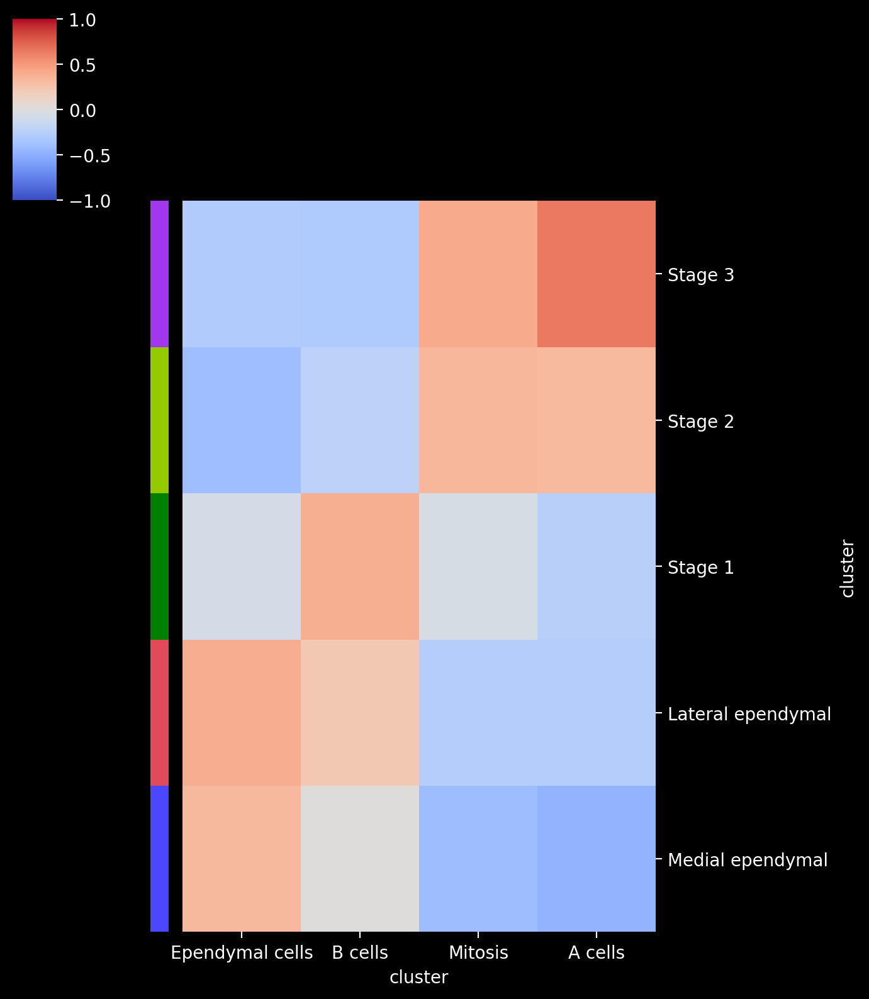

In [48]:
path = ["Medial ependymal", "Lateral ependymal", "Stage 1", "Stage 2", "Stage 3", "GABAergic striatum neurons"]
# get svz path
subref = subobstrj[subobstrj.obs["neurogenesis_pathway"].isin(path)]
subrefj = Jenie(subref, "subref svz", "subref_svz", "neurogenesis_pathway")

# correlate with bullya data
df = subrefj.corr_cebrian("neurogenesis_pathway", order_genes=["Stage 3", "Stage 2","Stage 1", "Lateral ependymal", "Medial ependymal"])

# Figure E

SVZ associated genes in Bullya Data

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


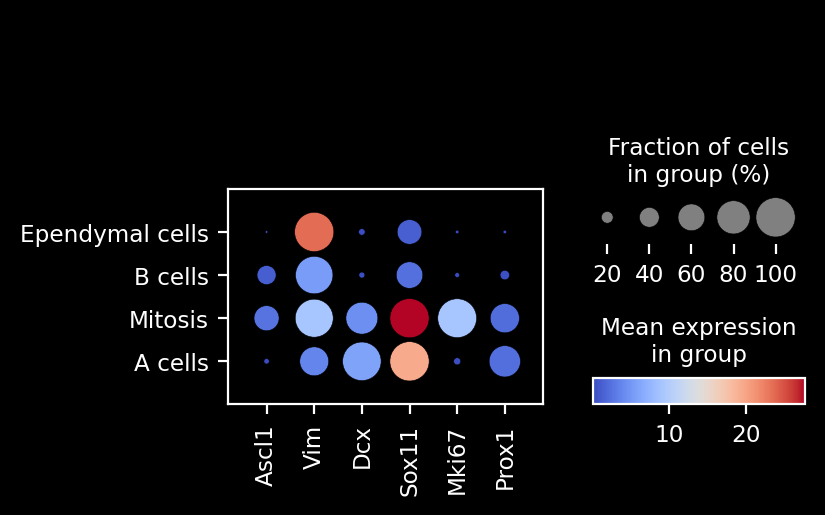

In [49]:
# read bullya data
bullyadata = sc.read("../DataF/supfig5/data.h5ad")

# markers for svz
markers = ["Ascl1", "Vim", "Dcx", "Sox11", "Mki67", "Prox1"]
# bullya celltypes
celltypes = ["B cells","Ependymal cells","A cells", "Mitosis", ]

# plot dotplot
sc.pl.dotplot(bullyadata[bullyadata.obs["Cell_Type"].isin(celltypes)], markers, groupby='Cell_Type', dendrogram=False, cmap="coolwarm")


# Figure F

SVZ associated genes in our data

/Users/kjenie/DataspellProjects/ptb_timepoints/.conda/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


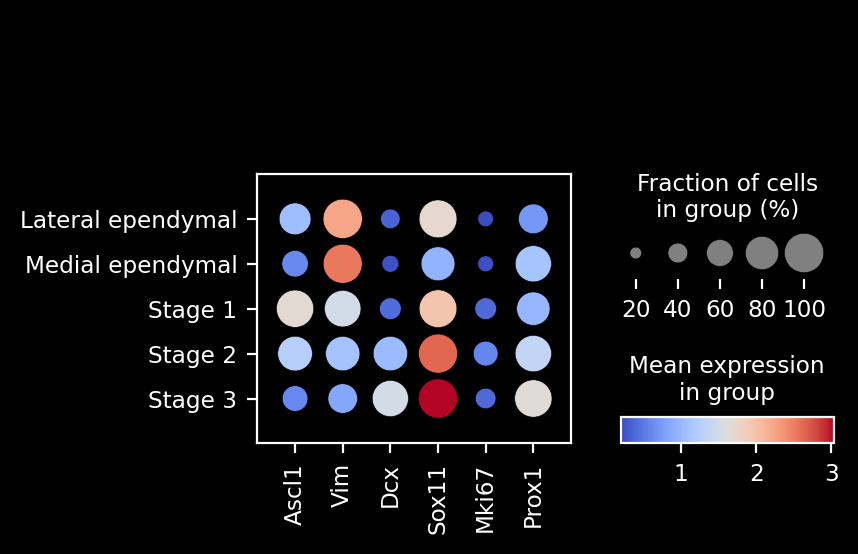

In [50]:
d = subrefj.data

sc.pl.dotplot(d[d.obs["neurogenesis_pathway"].isin(["Stage 3", "Stage 2","Stage 1", "Lateral ependymal", "Medial ependymal"])], markers, groupby='neurogenesis_pathway', dendrogram=False, cmap="coolwarm")
